In [335]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt 
import cv2 as cv

### Formatting

In [336]:
def label_transform(df_labels: pd.DataFrame, mode: str, im_height: int, im_width: int, round: bool = True) -> pd.DataFrame:
    """
    Transforms bounding box coordinates based on the specified mode.

    Args:
        df_labels: DataFrame containing bounding box coordinates (x, y, width, height).
        mode: Transformation mode ('absolute' or 'relative').
        im_height: Image height in pixels.
        im_width: Image width in pixels.
        round: Enable/Disable output rounding (default True).

    Returns:
        Transformed DataFrame with bounding box coordinates.

    Raises:
        AssertionError: If im_width or im_height is not an integer.
        ValueError: If mode is not 'absolute' or 'relative'.
    """

    assert isinstance(im_width, int), "Dimensions should be int numbers."
    assert isinstance(im_height, int), "Dimensions should be int numbers."
    assert isinstance(mode, str), "Mode should be a string"    
    assert isinstance(df_labels, pd.DataFrame), "df_labels must be a pandas DataFrame"

    if im_height == 0 or im_width == 0:
        raise ValueError("❕Debe introducir las dimensiones de la imagen (no pueden ser 0).")
    if mode == 'absolute':
        df_labels_abs = df_labels * [1, im_width, im_height, im_width, im_height]
        if round:
            df_labels_abs = df_labels_abs.round(0).astype(int)
        df_labels_abs['class_id'] = df_labels_abs['class_id'].astype(int)
        return df_labels_abs
    elif mode == 'relative':
        df_labels_rel = df_labels / [1, im_width, im_height, im_width, im_height]
        df_labels_rel['class_id'] = df_labels_rel['class_id'].astype(int)
        return df_labels_rel
    else:
        raise ValueError("❕Debe indicar el modo de transformación deseado ('absolute' o 'relative')")
    

In [ ]:
def lbl_to_bb(df_input: pd.DataFrame) -> pd.DataFrame:

    """
    Transforma un DataFrame de 'Etiquetas' a 'Bounding Boxes'.
    
    Args:
        df_input: Dataframe de coordenadas de Labels (x, y, width, height).
        
    Returns:
        df_output: Dataframe de coordenadas de Bounding Boxes (x0, y0, x1, y1).
    """
    
    # Extraer los valores como arrays NumPy (evita el overhead de Pandas)
    class_id = df_input['class_id'].values
    x_center, y_center = df_input[['x_center', 'y_center']].to_numpy().T
    width, height = df_input[['width', 'height']].to_numpy().T

    # Calcular coordenadas de bounding box de manera vectorizada
    x0 = x_center - width / 2
    x1 = x_center + width / 2
    y0 = y_center - height / 2
    y1 = y_center + height / 2


    # Crear el DataFrame con los resultados optimizados
    return pd.DataFrame({'class_id': class_id, 'x0': x0, 'x1': x1, 'y0': y0, 'y1': y1}).astype(int)


def bb_to_lbl(df_input: pd.DataFrame) -> pd.DataFrame:
    
    """
    Transforma un DataFrame de 'Bounding Boxes' a 'Etiquetas'.
    
    Args:
        df_input: Dataframe de coordenadas de Bounding Boxes (x0, y0, x1, y1).
        
    Returns:
        df_output:  Dataframe de coordenadas de Labels (x, y, width, height).

    """
    if type(df_input) == pd.DataFrame:
        if 'class_id' not in df_input.columns:
            # Extraer los valores de las coordenadas de los Bounding Boxes como arrays NumPy
            x0, x1 = df_input['x0'].values, df_input['x1'].values
            y0, y1 = df_input['y0'].values, df_input['y1'].values

            # Calcular las coordenadas del centro usando NumPy
            x_center = np.ceil((x0 + x1) / 2)
            y_center = np.ceil((y0 + y1) / 2)

            # Calcular el ancho (width) y la altura (height) usando NumPy
            width = x1 - x0
            height = y1 - y0

            # Crear el DataFrame con los resultados optimizados usando NumPy
            return pd.DataFrame({
                'x_center': x_center, 
                'y_center': y_center, 
                'width': width, 
                'height': height
            }).astype(int)
        else:
            # Extraer los valores de las coordenadas de los Bounding Boxes como arrays NumPy
            class_id = df_input['class_id'].values
            x0, x1 = df_input['x0'].values, df_input['x1'].values
            y0, y1 = df_input['y0'].values, df_input['y1'].values

            # Calcular las coordenadas del centro usando NumPy
            x_center = np.ceil((x0 + x1) / 2)
            y_center = np.ceil((y0 + y1) / 2)

            # Calcular el ancho (width) y la altura (height) usando NumPy
            width = x1 - x0
            height = y1 - y0

            # Crear el DataFrame con los resultados optimizados usando NumPy
            return pd.DataFrame({
                'class_id': class_id, 
                'x_center': x_center, 
                'y_center': y_center, 
                'width': width, 
                'height': height
            }).astype(int)
    else:
        raise TypeError("❕El tipo de entrada no es un DataFrame o una Serie de Pandas.")

In [382]:
def show_image(im):
    plt.figure(figsize=(20,10))
    plt.imshow(im)
    plt.show()

def show_points(im, labels, color=(255, 0, 0), thickness=-1):
    im_points = im.copy()
    im_height, im_width, _ = im_points.shape

    # Draw points
    for label in labels:
        x = 0
        y = 0
        for i, value in enumerate(label):
            if i == 1:
                x = round(value * im_width)
            elif i == 2:
                y = round(value * im_height)
        point = [x, y]
        cv.circle(im_points, center=point, radius=7, color=color, thickness=thickness)

    show_image(im_points)
    return im_points

def show_circle(im, coord, radius, color=(255, 0, 0), thickness=3):
    im_points = im.copy()
    cv.circle(im_points, center=coord, radius=radius, color=color, thickness=thickness)
    show_image(im_points)
    return im_points

# Apertura de archivos

In [339]:
#folder = '../data/samples/Labels'
folder = '../data/samples/Labels/'

In [340]:
files = os.listdir(f'{folder}/images/')
files = [f for f in files if f.endswith('.jpeg') or f.endswith('.jpg') or f.endswith('.png')]

In [341]:
print("Indexes: 0 -",len(files)-1)
files

Indexes: 0 - 3


['503_222_19_JPG.rf.6cf86aa731aa78259b00e568f8f450e9.jpg',
 '209_310_37_JPG.rf.379031d6f03cbee13379ab34cab6f468.jpg',
 '209_310_37_JPG.rf.fc1bab0d312b2f3ded60d51f809b6a2d.jpg',
 '209_205_50_JPG.rf.949b5aa6fdbf6a1f721c39ed5ddcebec.jpg']

In [342]:
file_name = files[2]
file_name, file_extension = os.path.splitext(file_name)
labels_file = f'{folder}labels/{file_name}.txt'
image_file = f'{folder}images/{file_name}.jpg'
labels_file

'../data/samples/Labels/labels/209_310_37_JPG.rf.fc1bab0d312b2f3ded60d51f809b6a2d.txt'

### Importing image

In [343]:
image = cv.imread(image_file)
im = cv.cvtColor(image, cv.COLOR_BGR2RGB)

In [344]:
#show_image(im)

### Importing annotations

In [345]:
with open(labels_file, 'r') as file:
    lines = file.readlines()
    lines = [line.strip() for line in lines]
    labels = [line.split() for line in lines]

In [346]:
# Convierte de string a int/float
labels = [[int(value) if i == 0 else float(value) 
          for i, value in enumerate(label)] for label in labels]

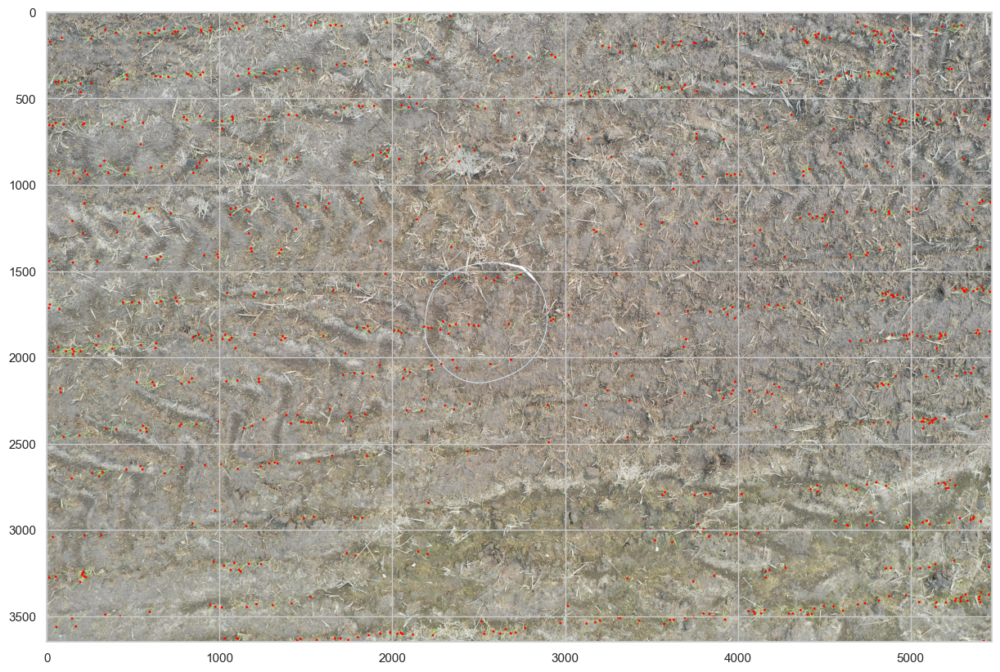

In [347]:
show_points(im, labels)

In [348]:
df_labels = pd.DataFrame(labels, columns=['class_id', 'x_center', 'y_center', 'width', 'height'])

class_id | x_center | y_center | width | height (normalized values)

In [349]:
df_labels['class_id'].value_counts()

class_id
0    848
Name: count, dtype: int64

In [350]:
# Filter out class 1
#df_labels = df_labels[df_labels['class_id'] != 0]

# Processing

In [351]:
H, W, _ = im.shape

In [352]:
H, W

(3648, 5472)

### Absolute values

In [353]:
df_labels

,class_id,x_center,y_center,width,height
0,0,0.909055,0.926094,0.002418,0.005863
1,0,0.991369,0.998503,0.004530,0.002993
2,0,0.996908,0.925093,0.006184,0.009767
3,0,0.988520,0.921149,0.007284,0.003048
4,0,0.986979,0.928128,0.004934,0.008723
...,...,...,...,...,...
843,0,0.062007,0.027659,0.007105,0.005249
844,0,0.047142,0.041637,0.012025,0.007341
845,0,0.015965,0.040463,0.006619,0.007711
846,0,0.003540,0.046573,0.007082,0.008544


In [354]:
# Se transforma el formato de relativo a absoluto
df_labels_abs = label_transform(df_labels, 'absolute', im_height=H, im_width=W)
df_labels_abs

,class_id,x_center,y_center,width,height
0,0,4974,3378,13,21
1,0,5425,3643,25,11
2,0,5455,3375,34,36
3,0,5409,3360,40,11
4,0,5401,3386,27,32
...,...,...,...,...,...
843,0,339,101,39,19
844,0,258,152,66,27
845,0,87,148,36,28
846,0,19,170,39,31


### Bounding Boxes calculation

In [355]:
df_BBoxes = lbl_to_bb(df_labels_abs)
df_BBoxes

,class_id,x0,x1,y0,y1
0,0,4967,4980,3367,3388
1,0,5412,5437,3637,3648
2,0,5438,5472,3357,3393
3,0,5389,5429,3354,3365
4,0,5387,5414,3370,3402
...,...,...,...,...,...
843,0,319,358,91,110
844,0,225,291,138,165
845,0,69,105,134,162
846,0,0,38,154,185


### Input format

In [356]:
df_BBoxes.head()

,class_id,x0,x1,y0,y1
0,0,4967,4980,3367,3388
1,0,5412,5437,3637,3648
2,0,5438,5472,3357,3393
3,0,5389,5429,3354,3365
4,0,5387,5414,3370,3402


In [357]:
df_to_list = df_BBoxes.copy()
del df_to_list['class_id']
list_BBoxes = df_to_list.values.tolist()

In [358]:
list_BBoxes[0]

[4967, 4980, 3367, 3388]

In [359]:
print(f"Cantidad de etiquetas importadas: {len(list_BBoxes)}")

Cantidad de etiquetas importadas: 848


# Circle ROI algorithm

| Altura | cm/px | Área (m2) |
|---|---|---|
| 3 | 0.070 | 9.8092760003 |
| 3.5 | 0.082 | 13.3515145559 |
| 5 | 0.120 | 28.7450726400 |

In [360]:
altura = 3.5 # Setear para distintas alturas

resolucion = {
    'Altura': [3, 3.5, 5], # m
    'Resolucion': [0.070, 0.082, 0.120], # cm/pixel
    'Area': [9.8092760003, 13.3515145559, 28.7450726400] # m²
}

if altura not in resolucion['Altura']:
    raise ValueError(f"❕No se ha definido el área cubierta para la altura {altura}m.\nAlturas disponibles: {resolucion['Altura']}")

res = resolucion['Resolucion'][resolucion['Altura'].index(altura)]
area = resolucion['Area'][resolucion['Altura'].index(altura)]
print(f"El área cubierta por la fotografía a {altura}m es de {area:.2f}m², con una resolución de {res:.3f}cm/pixel.")

El área cubierta por la fotografía a 3.5m es de 13.35m², con una resolución de 0.082cm/pixel.


In [361]:
altura = 3.5 # Setear para distintas alturas

resolucion = {
    'Altura': [3, 3.5, 5], # m
    'Resolucion': [0.070, 0.082, 0.120], # cm/pixel
    'Area': [9.8092760003, 13.3515145559, 28.7450726400] # m²
}

if altura not in resolucion['Altura']:
    raise ValueError(f"❕No se ha definido el área cubierta para la altura {altura}m.\nAlturas disponibles: {resolucion['Altura']}")

res = resolucion['Resolucion'][resolucion['Altura'].index(altura)]
area = resolucion['Area'][resolucion['Altura'].index(altura)]
print(f"El área cubierta por la fotografía a {altura}m es de {area:.2f}m², con una resolución de {res:.3f}cm/pixel.")

El área cubierta por la fotografía a 3.5m es de 13.35m², con una resolución de 0.082cm/pixel.


In [362]:
area_aro = 0.25 # m2

In [363]:
# Convert resolution from cm²/pixel to m²/pixel
res_m2_per_pixel = res / 100**2  # 1 cm² = 0.0001 m²

# Calculate the radius in meters
radius_m = np.sqrt(area_aro / np.pi)  # meters

# Convert radius to pixels
radius_px = radius_m / np.sqrt(res_m2_per_pixel)  # pixels
diameter_px = int(radius_px*2)
diameter_px

197

### Functions

In [364]:
def check_circle_bbox_intersection(cx, cy, radius, x_min, y_min, x_max, y_max):
    """
    Checks if a circle intersects with an axis-aligned bounding box.

    Args:
        cx (float): X-coordinate of the circle's center.
        cy (float): Y-coordinate of the circle's center.
        radius (float): Radius of the circle.
        x_min (float): Minimum x-coordinate of the bounding box.
        y_min (float): Minimum y-coordinate of the bounding box.
        x_max (float): Maximum x-coordinate of the bounding box.
        y_max (float): Maximum y-coordinate of the bounding box.

    Returns:
        bool: True if the circle and bounding box intersect, False otherwise.
    """
    # Find the closest point on the rectangle to the center of the circle
    closest_x = max(x_min, min(cx, x_max))
    closest_y = max(y_min, min(cy, y_max))

    # Calculate the distance between the circle's center and this closest point
    dist_x = cx - closest_x
    dist_y = cy - closest_y

    # If the distance is less than the radius, an intersection occurs
    # Using squared distance to avoid computationally expensive sqrt
    distance_squared = (dist_x ** 2) + (dist_y ** 2)
    return distance_squared <= (radius ** 2)

In [365]:
# def analyze_pixel_intersections(image_shape, bounding_boxes, radius):
#     """
#     Iterates through possible top-left positions for a circle, ensuring the
#     circle stays within image boundaries. Counts bounding box intersections
#     for each valid circle position and returns results as a DataFrame.

#     Args:
#         image_shape (tuple): The shape of the image (height, width).
#         bounding_boxes (list or np.ndarray): A list or array of bounding boxes.
#                                            Each box represented as [x_min, y_min, x_max, y_max].
#         radius (float): The radius of the circle.

#     Returns:
#         pd.DataFrame: DataFrame with columns 'x', 'y' (top-left corner of circle's
#                       bounding box), 'object_count'. Returns empty DataFrame if
#                       circle diameter exceeds image dimensions.
#     """
#     height, width = image_shape[:2]
#     results = []

#     # Calculate the diameter for boundary checks
#     diameter = 2 * radius

#     # Determine the valid range for the top-left corner (x, y)
#     # The maximum x must ensure x + diameter <= width
#     # The maximum y must ensure y + diameter <= height
#     max_x = width - diameter
#     max_y = height - diameter

#     # Check if the circle can fit within the image at all
#     if max_x < 0 or max_y < 0:
#         print(f"Warning: Circle diameter ({diameter}) is larger than image dimensions ({width}, {height}). No valid positions possible.")
#         # Return an empty DataFrame with the expected columns
#         return pd.DataFrame(columns=['x', 'y', 'object_count'])

#     print(f"Analyzing image of shape ({height}, {width}) with radius {radius}.")
#     print(f"Valid top-left corner range: x [0, {int(max_x)}], y [0, {int(max_y)}]")

#     # Iterate through valid top-left corner positions (x, y)
#     # Use int(max_y) + 1 and int(max_x) + 1 because range() is exclusive
#     # and coordinates should be integers.
#     # Also ensures range doesn't try negative values if max_x/max_y are slightly negative due to float precision
#     y_limit = int(max_y) + 1
#     x_limit = int(max_x) + 1

#     for y in range(y_limit):
#         if y % (max(1, y_limit // 10)) == 0 and y > 0: # Progress indicator update
#              print(f"  Processed {y}/{y_limit} rows for top-left y...")

#         for x in range(x_limit):
#             # Calculate the circle's center based on the top-left corner (x, y)
#             cx = x + radius
#             cy = y + radius

#             intersection_count = 0

#             # Check intersection with each bounding box
#             for box in bounding_boxes:
#                 x_min, y_min, x_max, y_max = box
#                 # Use the calculated center (cx, cy) for intersection check
#                 if check_circle_bbox_intersection(cx, cy, radius, x_min, y_min, x_max, y_max):
#                     intersection_count += 1

#             # Store the result for this top-left position (x, y)
#             results.append({'x': x, 'y': y, 'object_count': intersection_count})

#     print("Analysis complete. Creating DataFrame...")
#     # Convert the list of results into a Pandas DataFrame
#     results_df = pd.DataFrame(results)
#     return results_df

In [366]:
import time
average_time = 0
counter = 0
cum_time = 0

In [367]:
import humanize
def make_it_readable(value, type='t'):
    """
    Converts seconds to a human-readable format.
    
    Args:
        seconds (float): Time in seconds.
        
    Returns:
        str: Human-readable time format.
    """
    if type == 't':
        return humanize.naturaldelta(value)
    elif type == 'v':
        a = humanize.intcomma(value)
        b = humanize.intword(value)
        return b
    else:
        raise ValueError("❕Invalid type. Use 't' for time or 'v' for value.")

In [368]:
from tqdm import tqdm # Import tqdm
def analyze_pixel_intersections(image_shape, bounding_boxes, radius):
    """
    Iterates through possible top-left positions for a circle, ensuring the
    circle stays within image boundaries. Counts bounding box intersections
    for each valid circle position and returns results as a DataFrame.
    Includes a tqdm progress bar.

    Args:
        image_shape (tuple): The shape of the image (height, width).
        bounding_boxes (list or np.ndarray): A list or array of bounding boxes.
                                           Each box represented as [x_min, y_min, x_max, y_max].
        radius (float): The radius of the circle.

    Returns:
        pd.DataFrame: DataFrame with columns 'x', 'y' (top-left corner of circle's
                      bounding box), 'object_count'. Returns empty DataFrame if
                      circle diameter exceeds image dimensions.
    """
    # XOXOXOXOXOXOXOXOXOX
    global average_time
    global counter
    global cum_time
    average_time = 0
    counter = 0
    cum_time = 0
    # XOXOXOXOXOXOXOXOXOX
    height, width = image_shape[:2]
    results = []

    diameter = 2 * radius
    max_x = width - diameter
    max_y = height - diameter

    if max_x < 0 or max_y < 0:
        print(f"Warning: Circle diameter ({diameter}) is larger than image dimensions ({width}, {height}). No valid positions possible.")
        return pd.DataFrame(columns=['x', 'y', 'object_count'])

    print(f"Analyzing image of shape ({height}, {width}) with radius {radius}.")
    print(f"Valid top-left corner range: x [0, {int(max_x)}], y [0, {int(max_y)}]")

    y_limit = int(max_y) + 1
    x_limit = int(max_x) + 1

    # --- TQDM Integration ---
    # Wrap the outer loop (y coordinate) with tqdm
    # desc provides a description, unit clarifies what each step represents
    for y in tqdm(range(y_limit), desc="Analyzing Rows", unit="row"):

        start_time = time.perf_counter() # <-------OXOXOXOXOXO
        # --- REMOVED manual progress print ---
        # if y % (max(1, y_limit // 10)) == 0 and y > 0:
        #      print(f"  Processed {y}/{y_limit} rows for top-left y...")

        for x in range(x_limit):
            cx = x + radius
            cy = y + radius
            intersection_count = 0

            for box in bounding_boxes:
                x_min, y_min, x_max, y_max = box
                if check_circle_bbox_intersection(cx, cy, radius, x_min, y_min, x_max, y_max):
                    intersection_count += 1

            results.append({'x': x, 'y': y, 'object_count': intersection_count})

        end_time = time.perf_counter() # <-------OXOXOXOXOXO
        if y == 0: initial_time = start_time
        elapsed_time = end_time - start_time
        total_time = end_time - initial_time
        cum_time += elapsed_time
        counter += 1
        average_time = (total_time) / (y + 1)
        estimated_time = average_time * (y_limit - y - 1)
        print(f"Estimated time remaining: {make_it_readable(estimated_time)}", end='\r')
    print("Analysis complete. Creating DataFrame...")
    results_df = pd.DataFrame(results)
    return results_df

In [369]:
from tqdm import tqdm # Import tqdm
def analyze_pixel_intersections(image_shape, bounding_boxes, diameter, pixel_step=1):
    """
    Iterates through possible top-left positions for a circle, ensuring the
    circle stays within image boundaries. Counts bounding box intersections
    for each valid circle position and returns results as a DataFrame.
    Includes a tqdm progress bar.

    Args:
        image_shape (tuple): The shape of the image (height, width).
        bounding_boxes (list or np.ndarray): A list or array of bounding boxes.
                                           Each box represented as [x_min, y_min, x_max, y_max].
        diameter (int): The diameter of the circle.
        pixel_step (int): The number of pixels to skip in each step.
                          A value of 1 analyzes every possible pixel.
                          A value of N analyzes every Nth pixel.

    Returns:
        pd.DataFrame: DataFrame with columns 'x', 'y' (top-left corner of circle's
                      bounding box), 'object_count'. Returns empty DataFrame if
                      circle diameter exceeds image dimensions.
    """
    # XOXOXOXOXOXOXOXOXOX
    global average_time
    global counter
    global cum_time
    average_time = 0
    counter = 0
    cum_time = 0
    # XOXOXOXOXOXOXOXOXOX
    height, width = image_shape[:2]
    results = []

    pixel_step = round(pixel_step)
    radius = round(diameter / 2)
    max_x = width - diameter
    max_y = height - diameter

    if max_x < 0 or max_y < 0:
        print(f"Warning: Circle diameter ({diameter}) is larger than image dimensions ({width}, {height}). No valid positions possible.")
        return pd.DataFrame(columns=['x', 'y', 'object_count'])

    print(f"Analyzing image of shape ({height}, {width}) with diameter {diameter} and pixel step {pixel_step}.")
    print(f"Valid top-left corner range: x [0, {int(max_x)}], y [0, {int(max_y)}]")

    y_limit = int(max_y) + 1
    x_limit = int(max_x) + 1

    # --- TQDM Integration ---
    # Wrap the outer loop (y coordinate) with tqdm
    # desc provides a description, unit clarifies what each step represents
    for y in tqdm(range(0, y_limit, pixel_step), desc="Analyzing Rows", unit="row"):

        start_time = time.perf_counter() # <-------OXOXOXOXOXO
        # --- REMOVED manual progress print ---
        # if y % (max(1, y_limit // 10)) == 0 and y > 0:
        #      print(f"  Processed {y}/{y_limit} rows for top-left y...")

        for x in range(0, x_limit, pixel_step):
            cx = x + radius
            cy = y + radius
            intersection_count = 0
            found_boxes = []

            for box in bounding_boxes:
                x_min, y_min, x_max, y_max = box
                if check_circle_bbox_intersection(cx, cy, radius, x_min, y_min, x_max, y_max):
                    intersection_count += 1
                    found_boxes.append(box)

            results.append({'x': x, 'y': y, 'object_count': intersection_count, 'found_boxes': found_boxes})

        end_time = time.perf_counter() # <-------OXOXOXOXOXO
        if y == 0: initial_time = start_time
        elapsed_time = end_time - start_time
        total_time = end_time - initial_time
        cum_time += elapsed_time
        counter += 1
        average_time = (total_time) / (y // pixel_step + 1) # Adjust counter for the step
        estimated_time = average_time * ((y_limit - y - 1) // pixel_step + (1 if (y_limit - y - 1) % pixel_step != 0 else 0))
        #print(f"Estimated time remaining: {make_it_readable(estimated_time)}", end='\r')
    print("Analysis complete. Creating DataFrame...")
    results_df = pd.DataFrame(results)
    return results_df

In [370]:
max_x = W - diameter_px
max_y = H - diameter_px

y_limit = int(max_y) + 1
x_limit = int(max_x) + 1

total_counts = y_limit * x_limit

In [371]:
print('Average time per iteration:', make_it_readable(average_time))
print('Calc average time:', make_it_readable(cum_time/counter) if counter > 0 else 0)
print('Total iterations:', make_it_readable(total_counts,'v'))
print('Total estimated time:', make_it_readable(average_time * (total_counts)))

Average time per iteration: a moment
Calc average time: 0
Total iterations: 18.2 million
Total estimated time: a moment


## Processing

In [372]:
print(H, W)
print(diameter_px)
print(round(H/diameter_px,2), round(W/diameter_px,2))

3648 5472
197
18.52 27.78


In [373]:
# 1. Define image dimensions
image_height = H
image_width = W
image_shape_example = (image_height, image_width)

# 2. Define bounding boxes
bboxes = labels

# 3. Define the circle radius
circle_diameter = round(diameter_px * 3.5) # Diameter = Radius * 2

# 4. Run the analysis function
intersection_df = analyze_pixel_intersections(image_shape_example, list_BBoxes, circle_diameter, pixel_step=diameter_px/2)

Analyzing image of shape (3648, 5472) with diameter 690 and pixel step 98.
Valid top-left corner range: x [0, 4782], y [0, 2958]


Analyzing Rows: 100%|██████████| 31/31 [00:01<00:00, 17.07row/s]

Analysis complete. Creating DataFrame...


In [374]:
# 5. Display the resulting DataFrame (optional)
print("\nResulting DataFrame sample:")
# The 'x' and 'y' columns now represent the TOP-LEFT corner of the circle's bounding box
print(f"\nTotal rows in DataFrame: {len(intersection_df)}")


Resulting DataFrame sample:

Total rows in DataFrame: 1519


In [375]:
intersection_df.sort_values(by='object_count', ascending=False)

,x,y,object_count,found_boxes
799,1470,1568,208,"[[2070, 2125, 21, 59], [1954, 1985, 39, 78], [..."
899,1666,1764,207,"[[2070, 2125, 21, 59], [1954, 1985, 39, 78], [..."
850,1666,1666,206,"[[2070, 2125, 21, 59], [1954, 1985, 39, 78], [..."
851,1764,1666,206,"[[2070, 2125, 21, 59], [1954, 1985, 39, 78], [..."
898,1568,1764,206,"[[2070, 2125, 21, 59], [1954, 1985, 39, 78], [..."
...,...,...,...,...
929,4606,1764,0,[]
928,4508,1764,0,[]
927,4410,1764,0,[]
926,4312,1764,0,[]


In [425]:
labels

,x_center,y_center,width,height
0,1504,1535,858,848
1,1604,1653,544,540
2,1610,1657,512,505
3,1605,1639,533,489
4,1836,1869,246,247
...,...,...,...,...
133,1034,1089,1837,1779
134,1046,1085,1844,1816
135,979,1023,1958,1897
136,1074,1100,1587,1565


In [ ]:
sample = intersection_df.sample()
df_found_boxes = pd.DataFrame(sample['found_boxes'].values[0], columns=['x0', 'y0', 'x1', 'y1'])
print(sample)
sample_coord = sample.x, sample.y
sample_labels = bb_to_lbl(df_found_boxes)
show_points(im, labels)

        x     y  object_count  \
607  1862  1176           138   

                                           found_boxes  
607  [[1075, 1111, 1933, 1959], [1332, 1383, 1876, ...  


TypeError: type str doesn't define __round__ method

        x    y  object_count found_boxes
137  3822  196             0          []


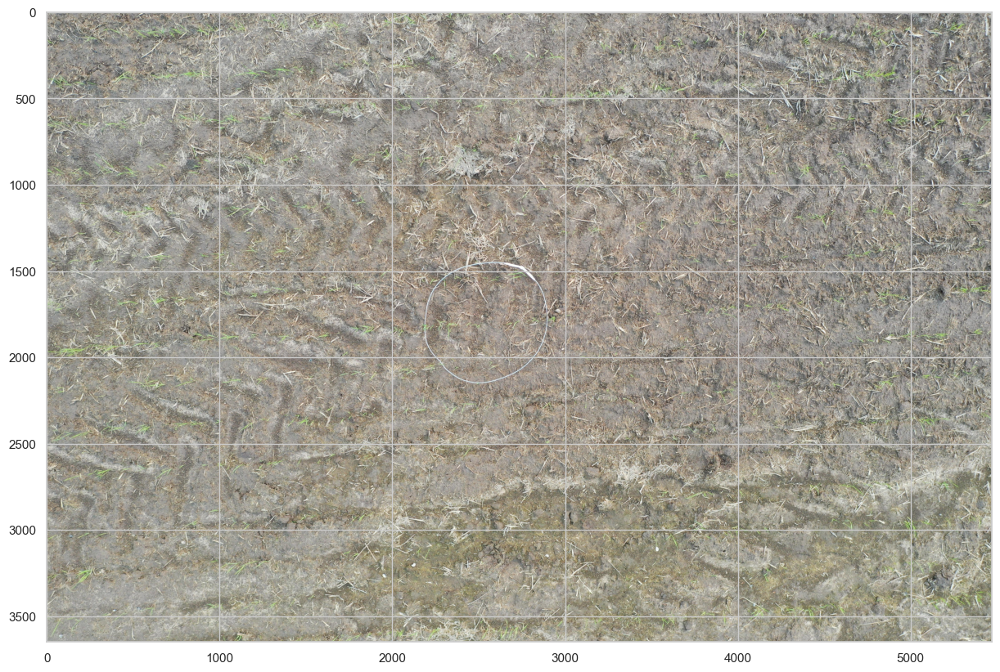

error: OpenCV(4.11.0) :-1: error: (-5:Bad argument) in function 'circle'
> Overload resolution failed:
>  - Can't parse 'center'. Sequence item with index 0 has a wrong type
>  - Can't parse 'center'. Sequence item with index 0 has a wrong type


In [387]:
sample = intersection_df.sample()
print(sample)
coord = sample.x, sample.y
points = show_points(im, sample['found_boxes'].values[0])
show_circle(points, coord, radius=circle_diameter//2)

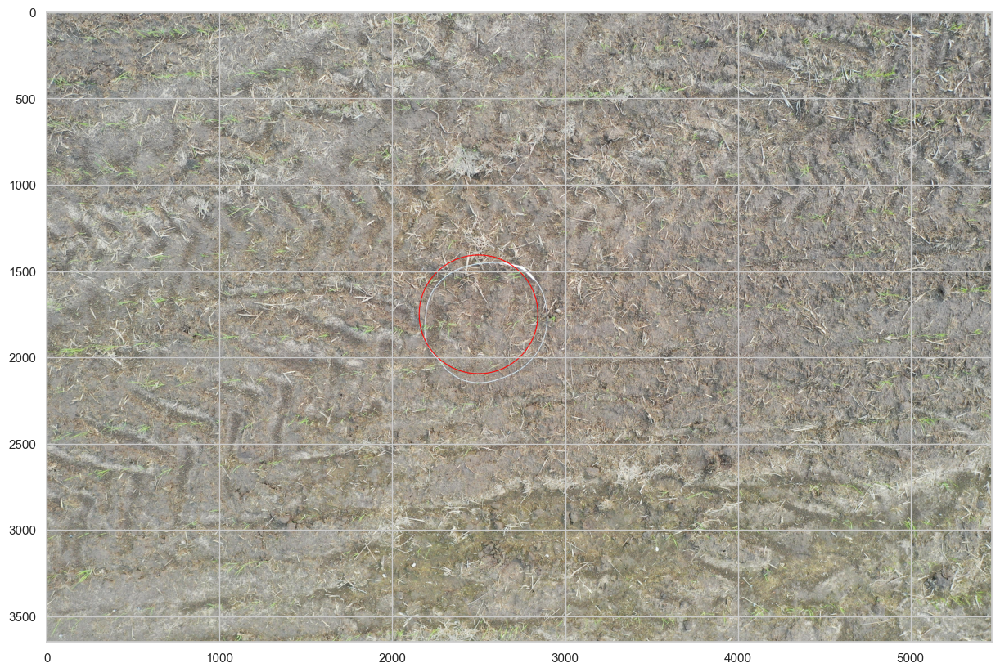

In [376]:
show_circle(im, (2500,1750), radius=int(diameter_px*3.5)//2)

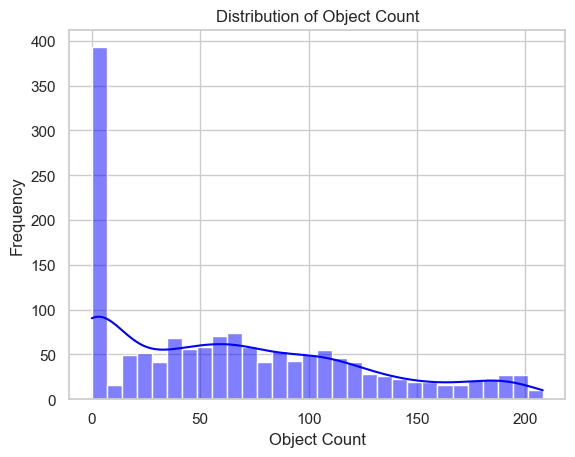

In [377]:
import seaborn as sns

# Plot the distribution curve for object_count
sns.set(style="whitegrid")
sns.histplot(intersection_df['object_count'], kde=True, bins=30, color='blue')

plt.title('Distribution of Object Count')
plt.xlabel('Object Count')
plt.ylabel('Frequency')
plt.show()

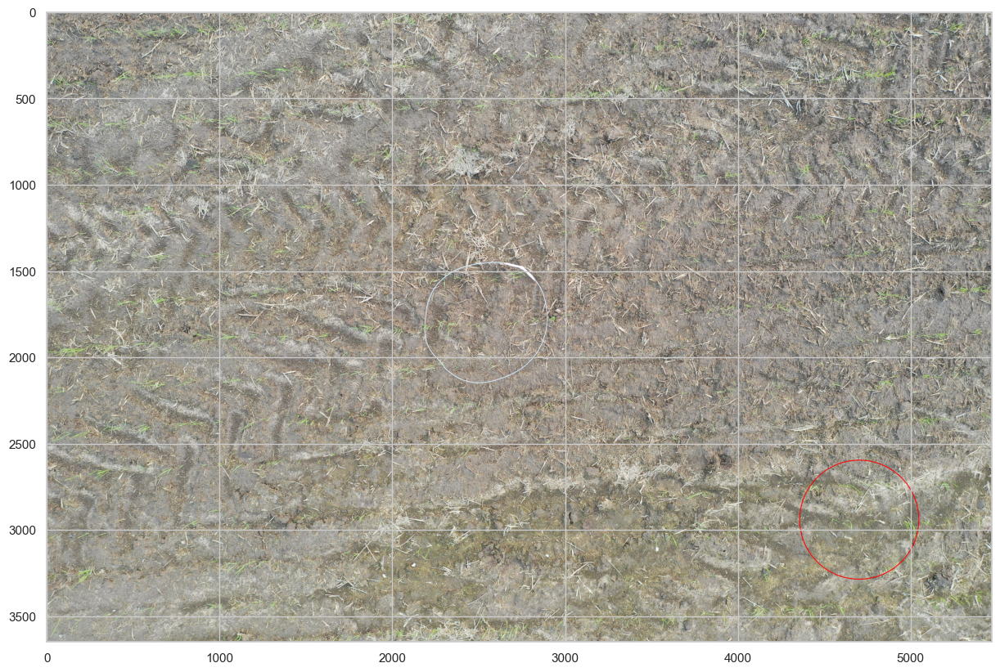

In [378]:
measurment = intersection_df.iloc[1518]
coord = measurment.x, measurment.y
show_circle(im, coord, radius=circle_diameter//2)